In [1]:
suppressPackageStartupMessages({
  library(Seurat)
  library(dplyr)
  library(ggplot2)
  library(scCustomize)
  library(scater)
    library(RColorBrewer)
    library(data.table)
    library(stringr)
library(tibble)
    library(tidyr)
    library(scDblFinder)
    library(scCustomize)
})

In [2]:
fig.size <- function (height, width, res=300) {
    options(repr.plot.height = height, repr.plot.width = width, resolution=res)
}

In [3]:
homo = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_homo.rds'
        )
)

In [4]:
hemi = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_hemi.rds'
        )
)

In [5]:
hemi.obj = SplitObject(hemi, split.by = "orig.ident")

In [6]:
homo.obj = SplitObject(homo, split.by = "orig.ident")

In [7]:
data.list = c(hemi.obj, homo.obj)

In [8]:
data.list

$het1
An object of class Seurat 
33411 features across 12856 samples within 2 assays 
Active assay: RNA (31411 features, 5000 variable features)
 3 layers present: scale.data, data, counts
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

$het2
An object of class Seurat 
33411 features across 6833 samples within 2 assays 
Active assay: RNA (31411 features, 5000 variable features)
 3 layers present: scale.data, data, counts
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

$het3
An object of class Seurat 
33411 features across 12546 samples within 2 assays 
Active assay: RNA (31411 features, 5000 variable features)
 3 layers present: scale.data, data, counts
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

$het4
An object of class Seurat 
33411 features across 13317 samples within 2 assays 
Active assay: RNA (31411 features, 5000 variable features)
 3 layers present: scale.data, data, 

In [9]:
features <- SelectIntegrationFeatures(object.list = data.list)

No variable features found for object6 in the object.list. Running FindVariableFeatures ...

No variable features found for object7 in the object.list. Running FindVariableFeatures ...

No variable features found for object8 in the object.list. Running FindVariableFeatures ...

No variable features found for object9 in the object.list. Running FindVariableFeatures ...

No variable features found for object10 in the object.list. Running FindVariableFeatures ...



In [10]:
immune.anchors <- FindIntegrationAnchors(
    object.list = data.list, 
    anchor.features = features, 
    reduction = "rpca"
)

Scaling features for provided objects

Warning message:
“Different features in new layer data than already exists for scale.data”
Computing within dataset neighborhoods

Finding all pairwise anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 7194 anchors



In [11]:
immune.combined <- IntegrateData(anchorset = immune.anchors)

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Warning message:
“Different cells and/or features from existing assay integrated”


In [12]:
DefaultAssay(immune.combined) <- "integrated"

# Run the standard workflow for visualization and clustering
immune.combined <- ScaleData(immune.combined, verbose = FALSE)
immune.combined <- RunPCA(immune.combined, npcs = 30, verbose = FALSE)
immune.combined <- RunUMAP(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindNeighbors(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindClusters(immune.combined, resolution = 0.5)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
12:36:37 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

12:36:37 Read 99298 rows and found 30 numeric columns

12:36:37 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

12:36:37 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:36:44 Writing NN index file to 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 99298
Number of edges: 2854243

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9039
Number of communities: 20
Elapsed time: 39 seconds


1 singletons identified. 19 final clusters.



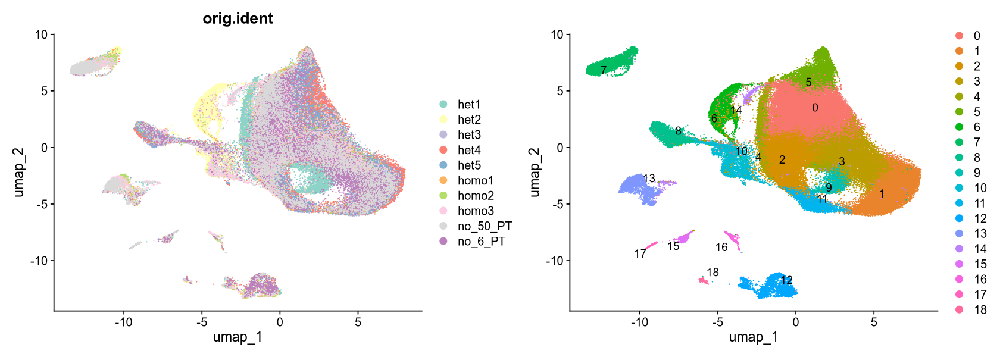

In [13]:
fig.size(5,14)
palette_name <- "Set3"
num_colors <- 10

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)

# Plot with the selected palette
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident") +
  scale_color_manual(values = colors)

p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE)
p1 + p2

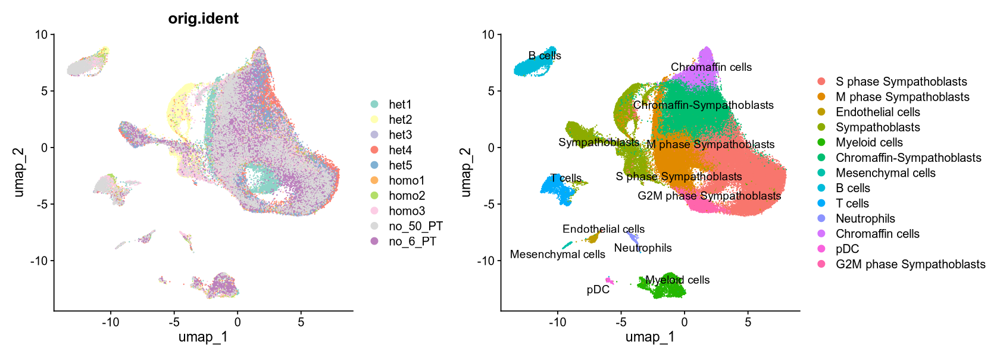

In [51]:
fig.size(5,14)
palette_name <- "Set3"
num_colors <- 10

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)

# Plot with the selected palette
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident") +
  scale_color_manual(values = colors)

p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE)
p1 + p2

In [52]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Homozygous-Hemizygous_integrated_umap_orig_ident.pdf'),
    plot =p1, 
    height = 5,
    width = 7,
    create.dir=TRUE
      )

In [21]:
names_vector = immune.combined$orig.ident %>% unique

In [22]:
hemi_labels <- names_vector[grepl("^het", names_vector)]
homo_labels <- names_vector[grepl("^homo", names_vector) | grepl("^no_", names_vector)]

In [23]:
hemi_labels

[1] "het1" "het2" "het3" "het4" "het5"

In [25]:
immune.combined$dataset = ifelse(immune.combined$orig.ident %in% hemi_labels, "hemi", "homo")

Warning message in brewer.pal(num_colors, palette_name):
“minimal value for n is 3, returning requested palette with 3 different levels
”


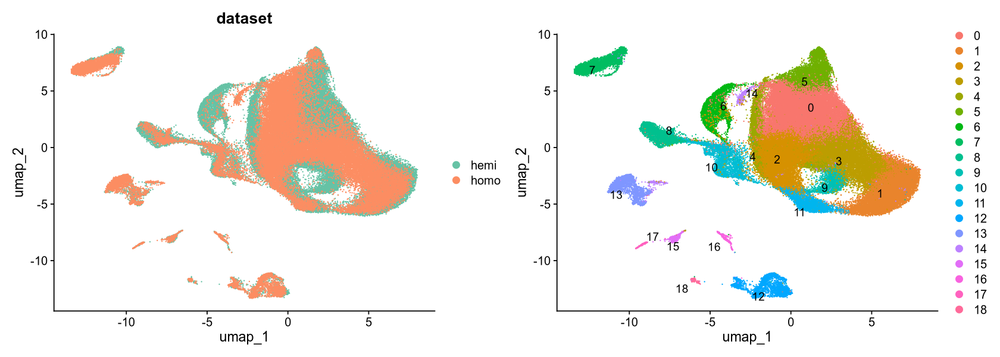

In [28]:
fig.size(5,14)
palette_name <- "Set2"
num_colors <- 2

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)

# Plot with the selected palette
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "dataset") +
  scale_color_manual(values = colors)

p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE)
p1 + p2

In [29]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Homozygous-Hemizygous_integrated_umap_genotype.pdf'),
    plot =p1, 
    height = 5,
    width = 7,
    create.dir=TRUE
      )

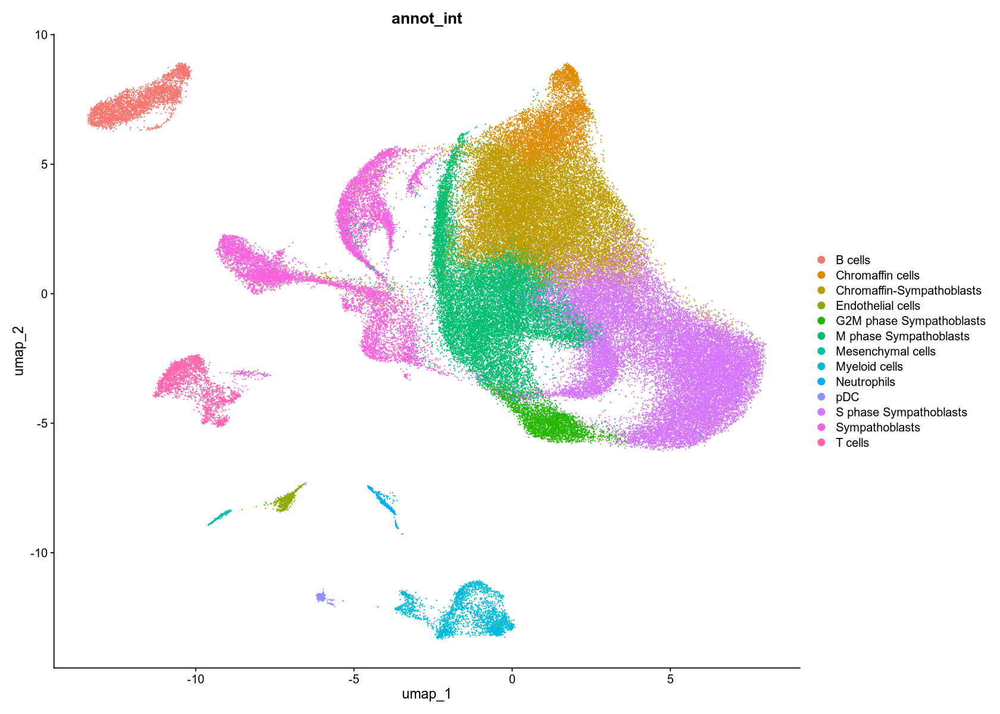

In [76]:
fig.size(10,14)
DimPlot(immune.combined, reduction = "umap", group.by = "annot_int")

In [34]:
getwd()

[1] "/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/notebook/With_Ribosom"

In [35]:
dotplot.sig.df = openxlsx::read.xlsx(
    'Cancer_Research_Revision_Notebooks/20240805_Figure1C_Dotplot_5-Homozygous_Samples.xlsx',sheet = 'Dotplot'
)

In [42]:
annotations.df = openxlsx::read.xlsx(
    'Cancer_Research_Revision_Notebooks/20240814_10-tumors-Integrated_Annotations.xlsx'
)

In [46]:
annot = annotations.df$Annotation
immune.combined@meta.data$annot_int = annot[ immune.combined$seurat_clusters ]
Idents(immune.combined) = "annot_int"

In [47]:
combined = immune.combined

In [48]:
combined$annot_int = factor(
    combined$annot_int, levels=na.omit(dotplot.sig.df$Annotation)) 

In [54]:
fig.size(20,8)
dotplot = DotPlot(
        combined, 
        assay='RNA',
        features = dotplot.sig.df$Gene %>% rev, 
        group.by='annot_int', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [53]:
fig.size(10,14)
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "annot_int")

ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Homozygous-Hemizygous_integrated_annotated_umap.pdf'),
    plot =p1, 
    height = 10,
    width = 14,
    create.dir=TRUE
      )

In [55]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Homozygous-Hemizygous_integrated_annotated_dotplot.pdf'),
    plot =p1, 
    height = 20,
    width = 8,
    create.dir=TRUE
      )

In [56]:
saveRDS(immune.combined,
        glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_10_hemi_homo_integrated.rds'
    )
)

In [58]:
furlan_list = openxlsx::read.xlsx(
    '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/notebook/With_Ribosom/spread_sheet/Figure2A_20230629_Furlan2017_signature.xlsx')

Hanemaa_list = openxlsx::read.xlsx(
    '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/notebook/With_Ribosom/spread_sheet/Figure2A_20230629_Hanemaaijer2021_Signature.xlsx')

kameneva_list = openxlsx::read.xlsx('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/notebook/With_Ribosom/Cancer_Research_Revision_Notebooks/Figure2A_20240807_Kameneva2021_signature.xlsx')


In [59]:


gene_sets <- split(furlan_list$Gene, furlan_list$Annotation)

In [60]:
homo = AddModuleScore(
        object = homo,
        features = gene_sets,
    name = paste0('Furlan_',names(gene_sets))
    )
hemi = AddModuleScore(
        object = hemi,
        features = gene_sets,
    name = paste0('Furlan_',names(gene_sets))
    )

In [64]:
gene_sets <- split( Hanemaa_list$Gene, Hanemaa_list$Annotation)

homo = AddModuleScore(
        object = homo,
        features = gene_sets,
    name = paste0('Hanema_',names(gene_sets))
    )
hemi = AddModuleScore(
        object = hemi,
        features = gene_sets,
    name = paste0('Hanema_',names(gene_sets))
    )

Warning message:
“The following features are not present in the object: 2900027M19Rik, Rian, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: 2900027M19Rik, Rian, not searching for symbol synonyms”


In [65]:
gene_sets <- split( kameneva_list$Gene, kameneva_list$Annotation)

In [66]:
homo = AddModuleScore(
        object = homo,
        features = gene_sets,
    name = paste0('Kamenova_',names(gene_sets))
    )
hemi = AddModuleScore(
        object = hemi,
        features = gene_sets,
    name = paste0('Kamenova_',names(gene_sets))
    )

In [67]:
signature_columns <- c('Furlan_Bridge1', 'Furlan_Chromaffin2', 'Furlan_SCP3', 'Furlan_Sympathoblasts4',
                       'Hanema_Bridge1', 'Hanema_Committed Progenitors2', 'Hanema_E chromaffin3',
                       'Hanema_N chromaffin4', 'Hanema_Neuroblast5', 'Hanema_Pre−E Chromaffin6',
                       'Hanema_SCP7', 'Kamenova_Bridge1', 'Kamenova_Chromaffin2', 'Kamenova_SCP3', 
                       'Kamenova_Sympathoblasts4')

# Fetch the data from the Seurat object
signature_scores <- FetchData(homo, vars = signature_columns)

In [70]:
fig.size(20,20)
feat_homo = FeaturePlot_scCustom(
    homo, 
    reduction = "umap", 
    features = signature_columns)

Warning message:
“Some of the plotted features are from meta.data slot.
• Please check that `na_cutoff` param is being set appropriately for those features.”


In [71]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Figure2A-Homozygous_outside_plot.pdf'),
    plot =feat_homo, 
    height = 20,
    width = 20,
    create.dir=TRUE
      )

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <88>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <92>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <88>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre

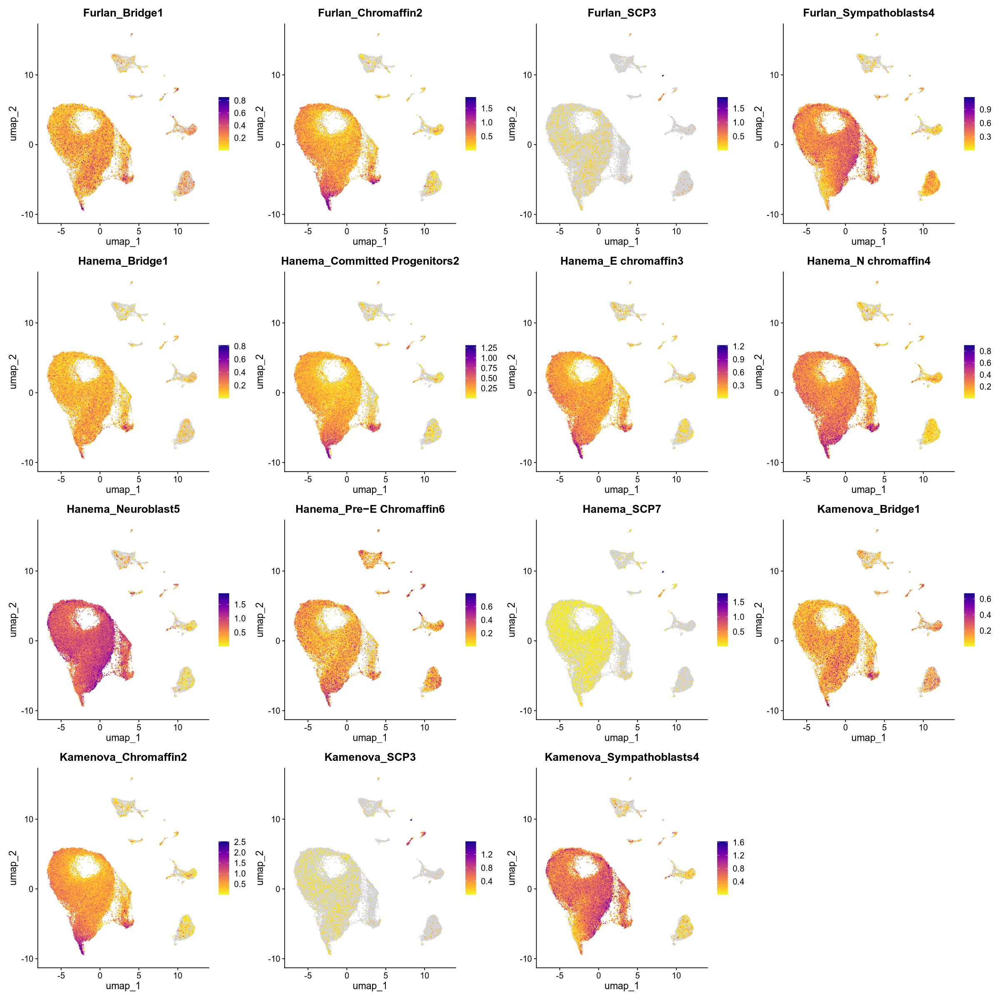

In [72]:
feat_homo

In [73]:
signature_columns <- c('Furlan_Bridge1', 'Furlan_Chromaffin2', 'Furlan_SCP3', 'Furlan_Sympathoblasts4',
                       'Hanema_Bridge1', 'Hanema_Committed Progenitors2', 'Hanema_E chromaffin3',
                       'Hanema_N chromaffin4', 'Hanema_Neuroblast5', 'Hanema_Pre−E Chromaffin6',
                       'Hanema_SCP7', 'Kamenova_Bridge1', 'Kamenova_Chromaffin2', 'Kamenova_SCP3', 
                       'Kamenova_Sympathoblasts4')

Warning message:
“Some of the plotted features are from meta.data slot.
• Please check that `na_cutoff` param is being set appropriately for those features.”


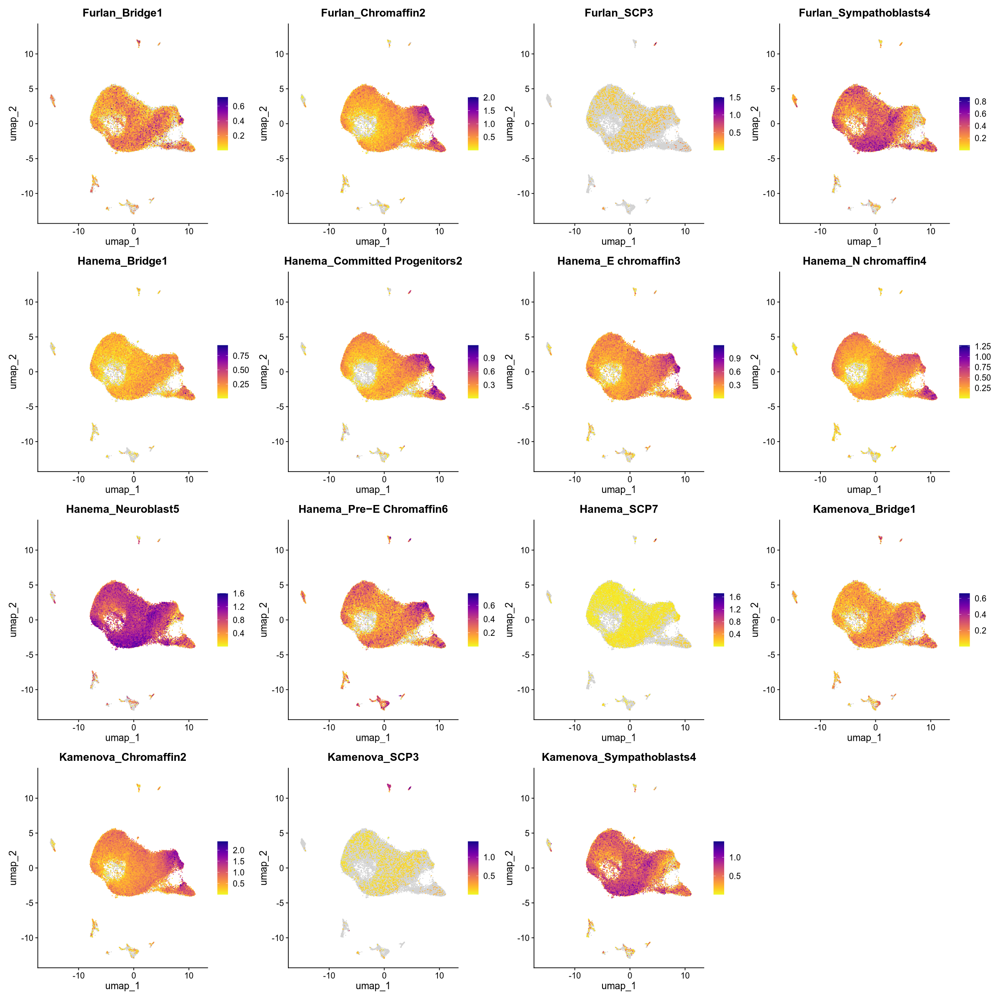

In [74]:
fig.size(20,20)
feat_hemi = FeaturePlot_scCustom(
    hemi, 
    reduction = "umap", 
    features = signature_columns)
feat_hemi

In [75]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Figure2A-Hemizygous_outside_plot.pdf'),
    plot =feat_hemi, 
    height = 20,
    width = 20,
    create.dir=TRUE
      )

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <88>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <92>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <88>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre

In [83]:
DefaultAssay(combined) = "RNA"

In [87]:
combined <- JoinLayers(combined, overwrite = TRUE)

In [88]:
combined

An object of class Seurat 
33411 features across 99298 samples within 2 assays 
Active assay: RNA (31411 features, 5000 variable features)
 3 layers present: scale.data, data, counts
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [89]:
names_sigs = c('Furlan', 'Hanema', 'Kamenova')

In [90]:
gene_sets <- split(furlan_list$Gene, furlan_list$Annotation)
combined = AddModuleScore(
        object = combined,
        features = gene_sets,
    name = paste0('Furlan_',names(gene_sets))
    )

In [91]:
gene_sets <- split( Hanemaa_list$Gene, Hanemaa_list$Annotation)
combined = AddModuleScore(
        object = combined,
        features = gene_sets,
    name = paste0('Hanema_',names(gene_sets))
    )

Warning message:
“The following features are not present in the object: 2900027M19Rik, Rian, not searching for symbol synonyms”


In [92]:
gene_sets <- split( kameneva_list$Gene, kameneva_list$Annotation)
combined = AddModuleScore(
        object = combined,
        features = gene_sets,
    name = paste0('Kamenova_',names(gene_sets))
    )

Warning message:
“Some of the plotted features are from meta.data slot.
• Please check that `na_cutoff` param is being set appropriately for those features.”


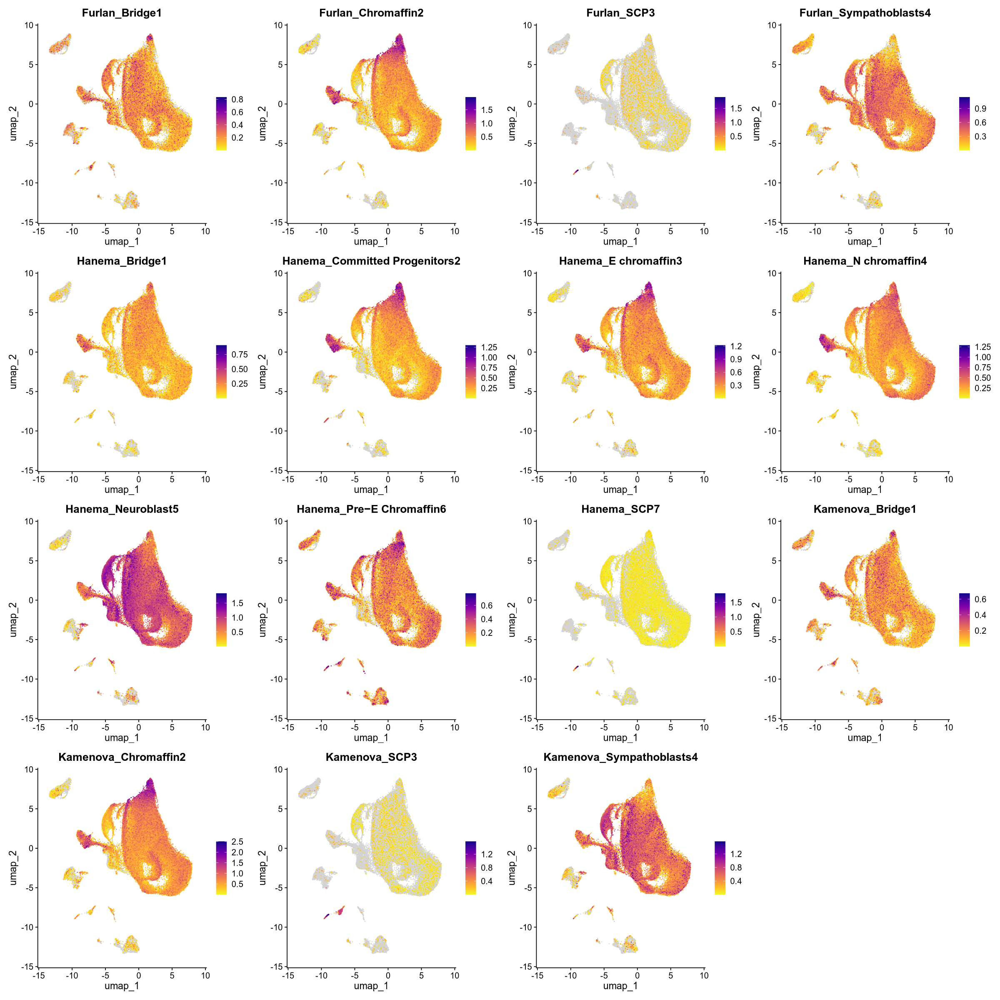

In [94]:
fig.size(20,20)
feat_combined = FeaturePlot_scCustom(
    combined, 
    reduction = "umap", 
    features = signature_columns)
feat_combined

In [95]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Figure2A-10_samples_Combined_outside_plot.pdf'),
    plot =feat_hemi, 
    height = 20,
    width = 20,
    create.dir=TRUE
      )

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <88>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <92>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre−E Chromaffin6' in 'mbcsToSbcs': dot substituted for <88>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Hanema_Pre

In [96]:
umap_list = list(
C1=c('Dhx36','Nsd1','Ktn1','Tsix'),
C2=c('Tbca','Pgk1','Fdps','Sod1'), 
C3=c('Fbxo5','Ccne1','Baiap2','Ddit4','Cdkn1a'),
C4=c('Ass1','Nos1','Crabp1','Hmx3')
)

In [97]:
homo = AddModuleScore(
    homo,
    features = umap_list,
    names = names(umap_list)
)

In [98]:
cnames = c('Cluster1','Cluster2','Cluster3','Cluster4')

Warning message:
“Some of the plotted features are from meta.data slot.
• Please check that `na_cutoff` param is being set appropriately for those features.”


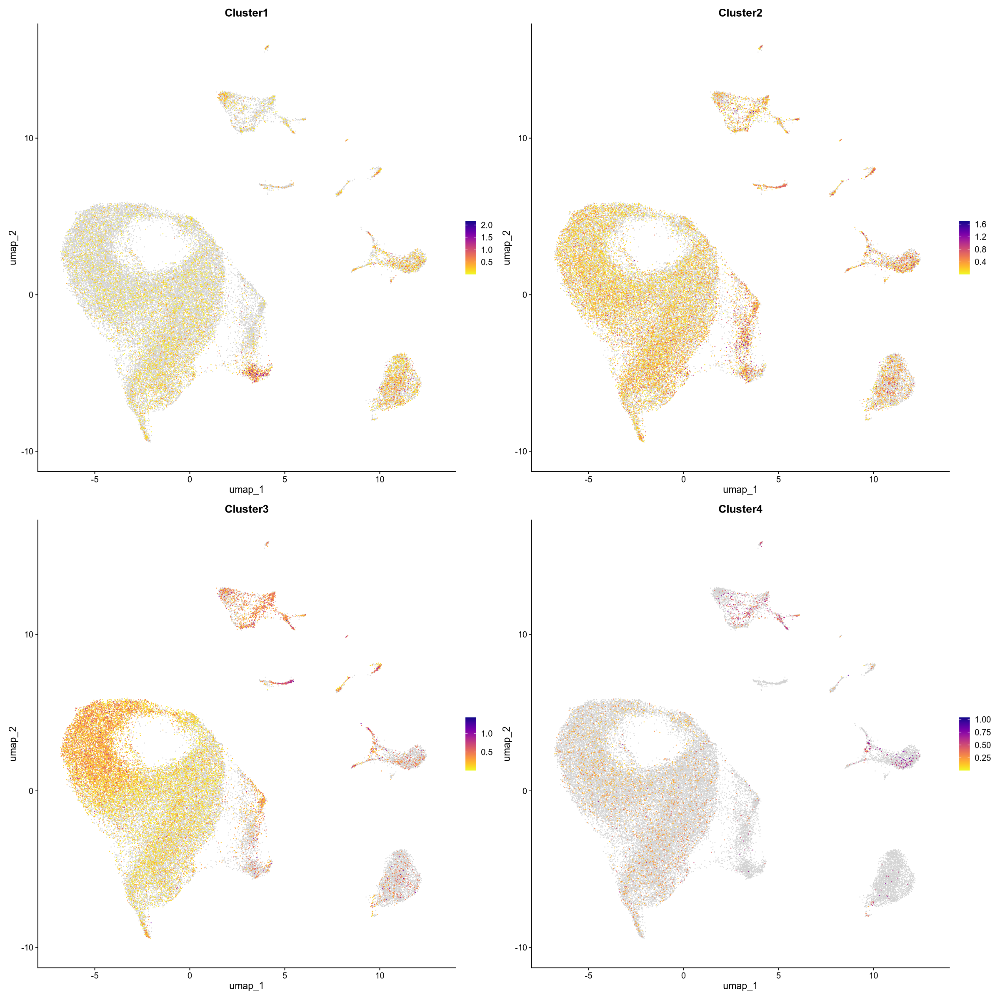

In [99]:
fig.size(20,20)
feat_combined = FeaturePlot_scCustom(
    homo, 
    reduction = "umap", 
    features = cnames)
feat_combined

In [100]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/FigureR1F-Homozygous_organoid_umap.pdf'),
    plot =feat_combined, 
    height = 10,
    width = 10,
    create.dir=TRUE
      )

## Integrate with Artem

In [102]:
artem.obj = readRDS(
    glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/data/3_sample_bam/',
        'seurat_objs/adrenal.mouse.seurat.rds'
    )
)

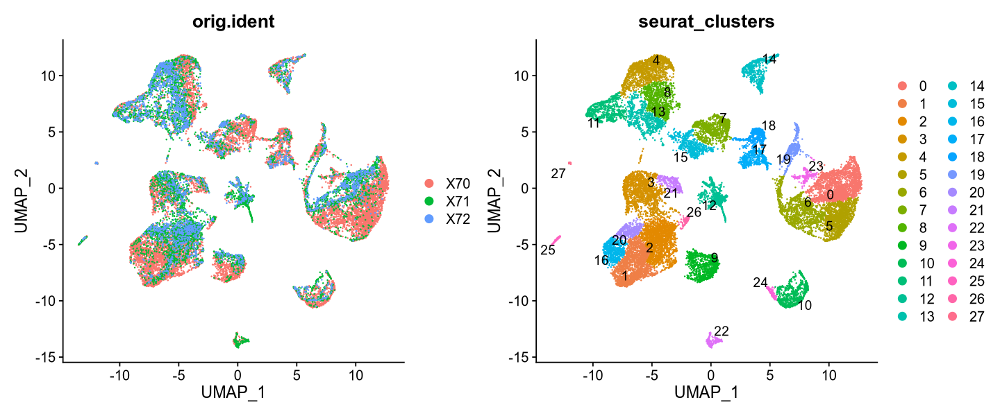

In [103]:
options(repr.plot.height=5, repr.plot.width=12, res=150 ) 
p1 <- DimPlot(artem.obj, reduction = "umap",group.by='orig.ident')
p2 <- DimPlot(artem.obj, 
              group.by = 'seurat_clusters',
              reduction = "umap", label = TRUE, repel = TRUE)
p1 + p2

In [137]:
Idents(artem.obj) = "seurat_clusters"

In [191]:
artem.obj.subset = subset(artem.obj, idents = c('7','17','18'))

In [192]:
levels(hemi) 

[1] "S phase Sympathoblasts"    "Sympathoblasts"           
 [3] "Endothelial cells"         "M phase Sympathoblasts"   
 [5] "Chromaffin-Sympathoblasts" "G2M phase Sympathoblasts" 
 [7] "Myeloid cells"             "Mesenchymal cells"        
 [9] "B cells"                   "T cells"                  
[11] "Neutrophils"               "Chromaffin cells"         
[13] "pDC"

In [193]:
hemi.subset = subset(hemi,idents = c('Mesenchymal cells', 'Chromaffin cells', 'Chromaffin-Sympathoblasts'))

In [194]:
Idents(homo) = "annot"

In [195]:
levels(homo)

[1] "Sympathoblasts"            "S phase Sympathoblasts"   
 [3] "G2M phase Sympathoblasts"  "M phase Sympathoblasts"   
 [5] "Chromaffin-Sympathoblasts" "Chromaffin cells"         
 [7] "NCC/Schwannian"            "Mesenchymal cells"        
 [9] "Endothelial cells"         "B cells"                  
[11] "T cells"                   "Myeloid cells"            
[13] "Neutrophils"               "mDC"                      
[15] "pDC"

In [196]:
homo.subset = subset(homo,idents = c('Mesenchymal cells', 'Chromaffin cells', 'Chromaffin-Sympathoblasts', 'NCC/Schwannian'))

In [197]:
hemi.subset.list = SplitObject(hemi.subset, split.by = "orig.ident")

In [198]:
homo.subset.list = SplitObject(homo.subset, split.by = "orig.ident")

### Artem Hemi 

In [108]:
artem.obj = UpdateSeuratObject(artem.obj)

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Updating matrix keys for DimReduc ‘pca’

Updating matrix keys for DimReduc ‘umap’

Warning message:
“Assay RNA changing from Assay to Assay”
Warning message:
“DimReduc pca changing from DimReduc to DimReduc”
Warning message:
“DimReduc umap changing from DimReduc to DimReduc”
Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Updating slots in RNA

Updating slots in RNA_nn

Setting default assay of RNA_nn to RNA

Updating slots in RNA_snn

Setting default assay of RNA_snn to RNA

Updating slots in pca

Updating slots in umap

Setting umap DimReduc to global

Setting assay used for NormalizeData.RNA to RNA

Setting assay used for FindVariableFeatures.RNA to RNA

Setting assay used for ScaleData.RNA to RNA

Setting assay used for RunPCA.RNA to RNA

Setting assay used for JackStraw.RNA.pca to RNA

No assay information could be found for ScoreJackStr

In [150]:
artem.list = SplitObject(artem.obj.subset, split.by = "orig.ident")

In [155]:
combined.list = c(artem.list, hemi.subset.list )

In [156]:
names(combined.list)

[1] "X70"  "X71"  "X72"  "het1" "het2" "het3" "het4" "het5"

In [157]:
features = SelectIntegrationFeatures(
    combined.list
)
s.obj.scaled = lapply(
    X = combined.list,
    FUN = function(x){
        x = ScaleData(x, features = features, verbose = FALSE)
        x = RunPCA(x, features = features, verbose = FALSE)
    }
)



Warning message:
“Different features in new layer data than already exists for scale.data”
Warning message:
“Number of dimensions changing from 30 to 50”
Warning message:
“Different features in new layer data than already exists for scale.data”
Warning message:
“Number of dimensions changing from 30 to 50”
Warning message:
“Different features in new layer data than already exists for scale.data”
Warning message:
“Number of dimensions changing from 30 to 50”
Warning message:
“Different features in new layer data than already exists for scale.data”
Warning message:
“Number of dimensions changing from 30 to 50”
Warning message:
“Different features in new layer data than already exists for scale.data”
Warning message:
“Number of dimensions changing from 30 to 50”


In [158]:
anchors = FindIntegrationAnchors(
    object.list = s.obj.scaled,
    reduction = 'rpca',
    dims = 1:50,
    
)

combined = IntegrateData(
    anchorset = anchors,
    dims = 1:50
)

Computing 2000 integration features

Scaling features for provided objects

Computing within dataset neighborhoods

Finding all pairwise anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1010 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 864 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 734 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 292 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 251 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 226 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 269 anchors

Projecting ne

In [164]:
DefaultAssay(combined) = "RNA"

In [165]:
combined <- JoinLayers(combined)

In [166]:
combined

An object of class Seurat 
34155 features across 11636 samples within 2 assays 
Active assay: RNA (32155 features, 5000 variable features)
 3 layers present: scale.data, data, counts
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [167]:
DefaultAssay(combined) = "integrated"

In [168]:
#combined <- ScaleData(combined, verbose = FALSE)
combined <- RunPCA(combined, npcs = 30, verbose = FALSE)
combined <- RunUMAP(combined, reduction = "pca", dims = 1:30)
combined <- FindNeighbors(combined, reduction = "pca", dims = 1:30)
combined <- FindClusters(combined, resolution = 0.5)

17:52:03 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

17:52:03 Read 11636 rows and found 30 numeric columns

17:52:03 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

17:52:03 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:52:04 Writing NN index file to temp file /tmp/Rtmp3Gg4fO/file1c18e363edd9fd

17:52:04 Searching Annoy index using 1 thread, search_k = 3000

17:52:07 Annoy recall = 100%

17:52:08 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:52:10 Initializing from normalized Laplacian 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11636
Number of edges: 419553

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8250
Number of communities: 11
Elapsed time: 1 seconds


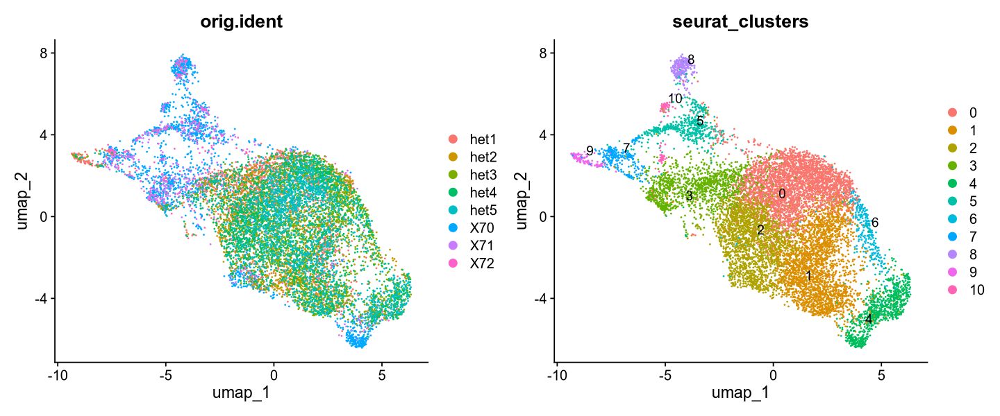

In [169]:
options(repr.plot.height=5, repr.plot.width=12, res=150 ) 
p1 <- DimPlot(combined, reduction = "umap",group.by='orig.ident')
p2 <- DimPlot(combined, 
              group.by = 'seurat_clusters',
              reduction = "umap", label = TRUE, repel = TRUE)
p1 + p2

In [170]:
combined$dataset = ifelse(combined$orig.ident %in% c('X70', 'X71', 'X72'), "adrenal", "neuroblastoma")

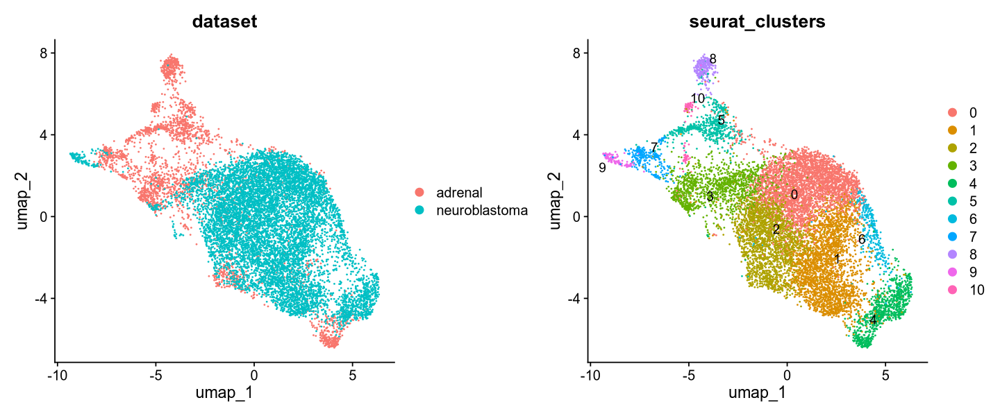

In [172]:
options(repr.plot.height=5, repr.plot.width=12, res=150 ) 
p1 <- DimPlot(combined, reduction = "umap",group.by='dataset')
p2 <- DimPlot(combined, 
              group.by = 'seurat_clusters',
              reduction = "umap", label = TRUE, repel = TRUE)
p1 + p2

In [130]:
annotations.df = openxlsx::read.xlsx(
    '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/spread_sheet/Figure2B_20220714_8samples_annotations_HEX.xlsx')

In [ ]:
DimPlot(combined, 
              group.by = 'seurat_clusters',
              reduction = "umap", label = TRUE, repel = TRUE)

In [131]:
merkers_txt = 'Phox2b
Ascl1
Th
Pnmt
Sox10
Plp1
Foxd3
Prph
Stmn2
Isl1
Chga
Penk
Htr3a
Elavl3
Elavl4
Erbb3
S100b
Ngfr
Hand2
Hmx1
Prph
Mki67
Penk
Cartpt'

markers_fig1 = strsplit(merkers_txt, '\n')[[1]] #toupper(strsplit(merkers_txt, '\n')[[1]])
markers_fig1



[1] "Phox2b" "Ascl1"  "Th"     "Pnmt"   "Sox10"  "Plp1"   "Foxd3"  "Prph"  
 [9] "Stmn2"  "Isl1"   "Chga"   "Penk"   "Htr3a"  "Elavl3" "Elavl4" "Erbb3" 
[17] "S100b"  "Ngfr"   "Hand2"  "Hmx1"   "Prph"   "Mki67"  "Penk"   "Cartpt"

In [161]:
DefaultAssay(combined) = "RNA"

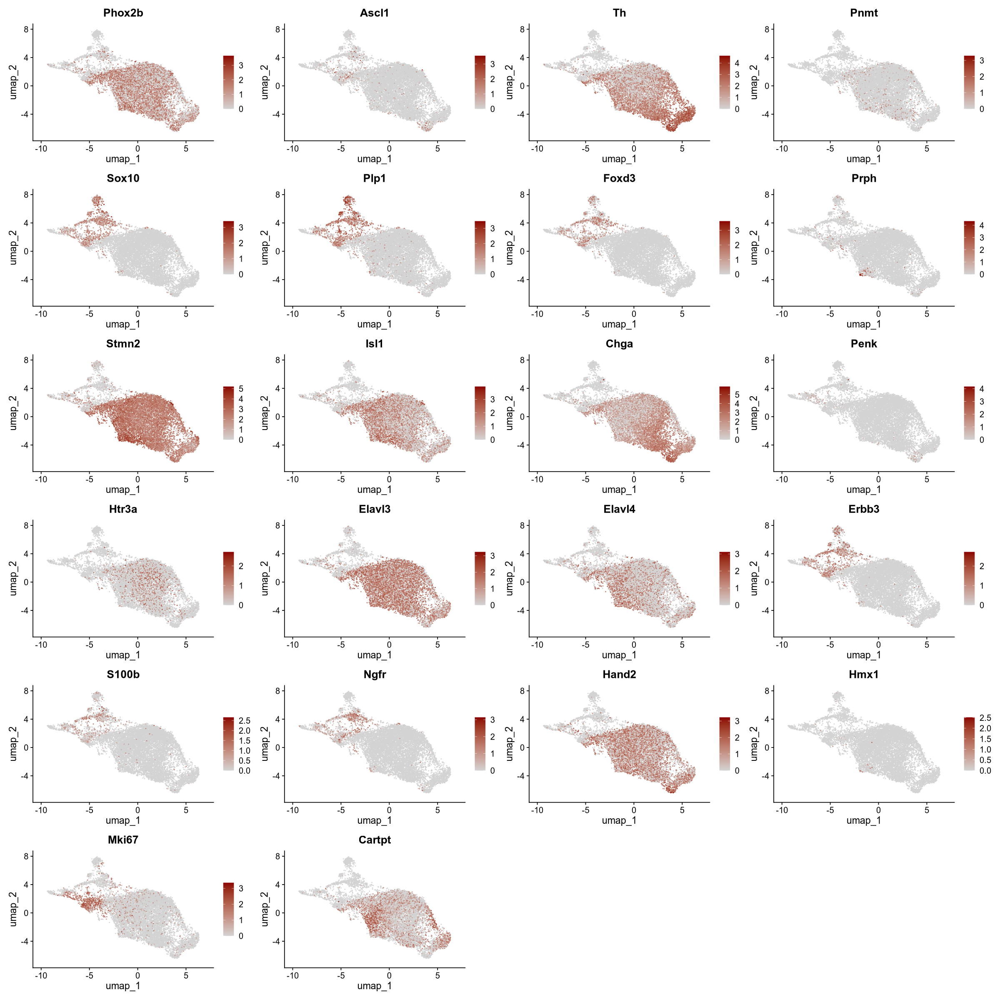

In [162]:
fig.size(20,20)
FeaturePlot(combined, feature=markers_fig1, cols = c("lightgrey", "darkred")) +NoLegend()

NULL

### Artem Homo

In [200]:
levels(artem.obj.subset)

[1] "7"  "17" "18"

In [201]:
artem.list = SplitObject(artem.obj.subset, split.by = "orig.ident")

In [202]:
combined.homo.list = c(artem.list, homo.subset.list )

In [203]:
features = SelectIntegrationFeatures(
    combined.homo.list
)
s.obj.scaled = lapply(
    X = combined.homo.list,
    FUN = function(x){
        x = ScaleData(x, features = features, verbose = FALSE)
        x = RunPCA(x, features = features, verbose = FALSE)
    }
)



No variable features found for object4 in the object.list. Running FindVariableFeatures ...

No variable features found for object5 in the object.list. Running FindVariableFeatures ...

No variable features found for object6 in the object.list. Running FindVariableFeatures ...

No variable features found for object7 in the object.list. Running FindVariableFeatures ...

No variable features found for object8 in the object.list. Running FindVariableFeatures ...

Warning message:
“Number of dimensions changing from 30 to 50”
Warning message:
“Number of dimensions changing from 30 to 50”
Warning message:
“Number of dimensions changing from 30 to 50”
Warning message:
“Number of dimensions changing from 30 to 50”
Warning message:
“Number of dimensions changing from 30 to 50”


In [204]:
anchors = FindIntegrationAnchors(
    object.list = s.obj.scaled,
    reduction = 'rpca',
    dims = 1:50,
    
)

combined = IntegrateData(
    anchorset = anchors,
    dims = 1:50
)

Computing 2000 integration features

No variable features found for object4 in the object.list. Running FindVariableFeatures ...

No variable features found for object5 in the object.list. Running FindVariableFeatures ...

No variable features found for object6 in the object.list. Running FindVariableFeatures ...

No variable features found for object7 in the object.list. Running FindVariableFeatures ...

No variable features found for object8 in the object.list. Running FindVariableFeatures ...

Scaling features for provided objects

Computing within dataset neighborhoods

Finding all pairwise anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 722 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 604 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 499 anchors

Projecting new data onto SVD


In [205]:
combined <- ScaleData(combined, verbose = FALSE)
combined <- RunPCA(combined, npcs = 30, verbose = FALSE)
combined <- RunUMAP(combined, reduction = "pca", dims = 1:30)
combined <- FindNeighbors(combined, reduction = "pca", dims = 1:30)
combined <- FindClusters(combined, resolution = 0.5)

18:11:29 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

18:11:29 Read 6119 rows and found 30 numeric columns

18:11:29 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

18:11:29 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:11:29 Writing NN index file to temp file /tmp/Rtmp3Gg4fO/file1c18e33f56fb8f

18:11:29 Searching Annoy index using 1 thread, search_k = 3000

18:11:30 Annoy recall = 100%

18:11:31 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

18:11:33 Initializing from normalized Laplacian +

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6119
Number of edges: 251924

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8577
Number of communities: 14
Elapsed time: 0 seconds


In [206]:
combined$dataset = ifelse(combined$orig.ident %in% c('X70', 'X71', 'X72'), "adrenal", "neuroblastoma")

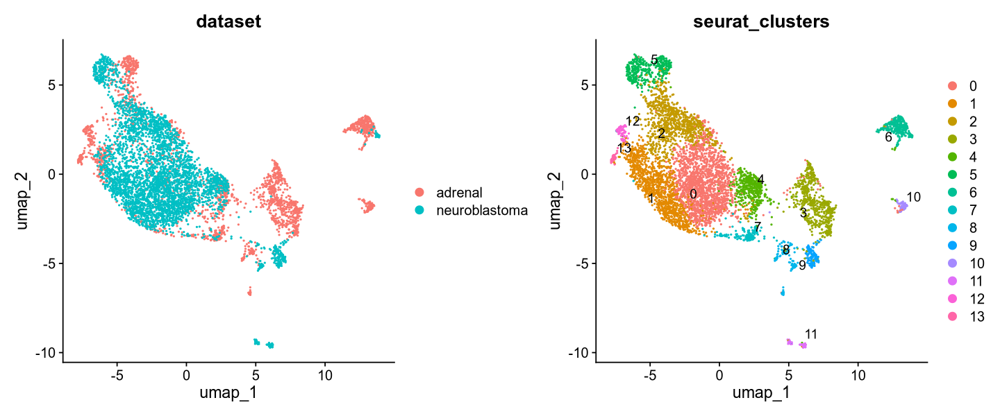

In [207]:
options(repr.plot.height=5, repr.plot.width=12, res=150 ) 
p1 <- DimPlot(combined, reduction = "umap",group.by='dataset')
p2 <- DimPlot(combined, 
              group.by = 'seurat_clusters',
              reduction = "umap", label = TRUE, repel = TRUE)
p1 + p2

In [208]:
DefaultAssay(combined) = "RNA"

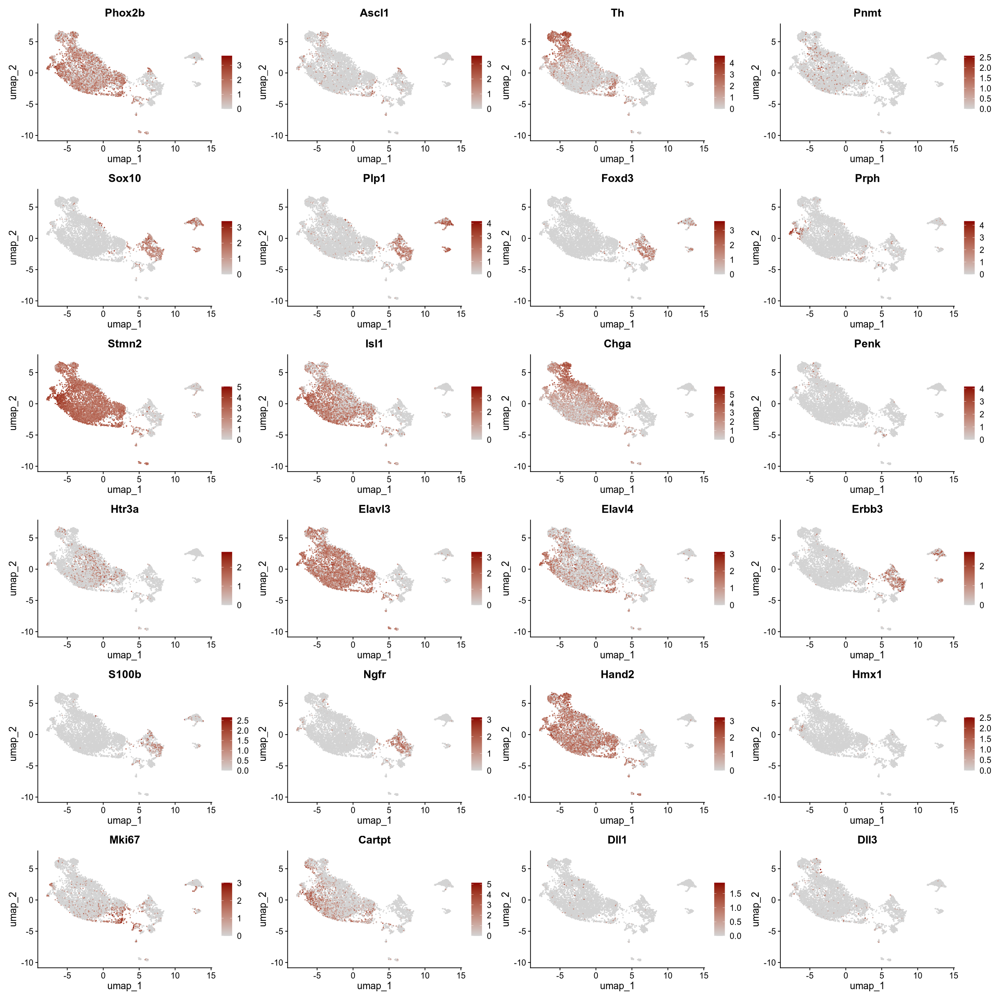

In [209]:
fig.size(20,20)
FeaturePlot(combined, feature=c(markers_fig1, 'Dll1', 'Ascl1','Dll3'), cols = c("lightgrey", "darkred")) +NoLegend()

## Genotype difference Analysis

In [210]:
seurat_obj = immune.combined

Warning message in brewer.pal(num_colors, palette_name):
“minimal value for n is 3, returning requested palette with 3 different levels
”


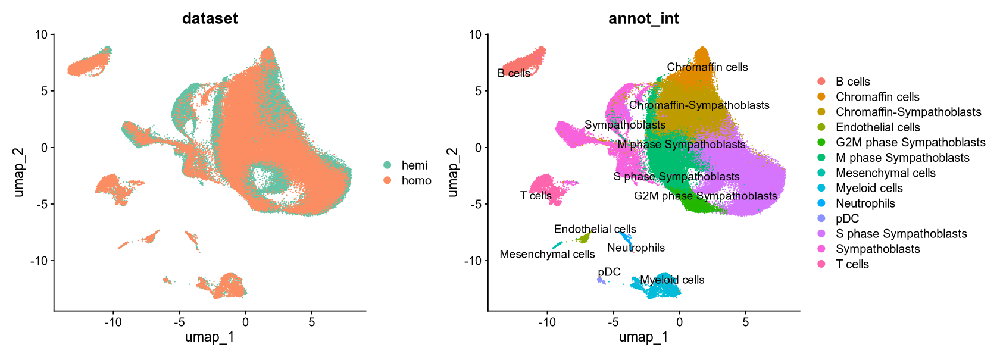

In [211]:
fig.size(5,14)
palette_name <- "Set2"
num_colors <- 2

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)

# Plot with the selected palette
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "dataset") +
  scale_color_manual(values = colors)

p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE, group.by = 'annot_int')
p1 + p2

In [212]:
homozygous_cells <- subset(seurat_obj, subset = dataset == "homo")
hemizygous_cells <- subset(seurat_obj, subset = dataset == "hemi")

In [248]:
de_results_genotype <- FindMarkers(seurat_obj, ident.1 = "hemi", ident.2 = "homo", group.by = "dataset")

Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”


In [249]:
head(de_results_genotype)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Cpa3,0,3.212535,0.000,0.057,0
Igkv10-94,0,-2.936690,0.000,0.057,0
Ighv1-5,0,-2.917996,0.000,0.062,0
Hbb-bs,0,2.909305,0.013,0.669,0
Tmc2,0,2.699581,0.001,0.010,0
Vpreb3,0,-2.599975,0.003,0.040,0


In [250]:
# Add a column for gene names
de_results_genotype$gene <- rownames(de_results_genotype)

# Order by adjusted p-value
de_results_genotype <- de_results_genotype[order(de_results_genotype$p_val_adj), ]

In [251]:
library(EnhancedVolcano)

In [265]:
fig.size(10,15)
# Create a publication-ready volcano plot
vplot = EnhancedVolcano(de_results_genotype,
                lab = de_results_genotype$gene,
                x = 'avg_log2FC',
                y = 'p_val_adj',
                title = 'Differential Expression: Hemizygous vs Homozygous',
                pCutoff = 0.01,
                FCcutoff = 1.0,
                pointSize = 2.0,
                labSize = 6,
                col=c('grey30', 'forestgreen', 'royalblue', 'red2'),
                colAlpha = 1,
                legendPosition = 'right',
                legendLabSize = 14,
                legendIconSize = 4.0,
                drawConnectors = TRUE,
                widthConnectors = 0.5,
                colConnectors = 'grey50',
                gridlines.major = FALSE,
                gridlines.minor = FALSE,
                border = 'full',
                borderWidth = 1.5,
                borderColour = 'black')

Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”


Warning message:
“ggrepel: 532 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


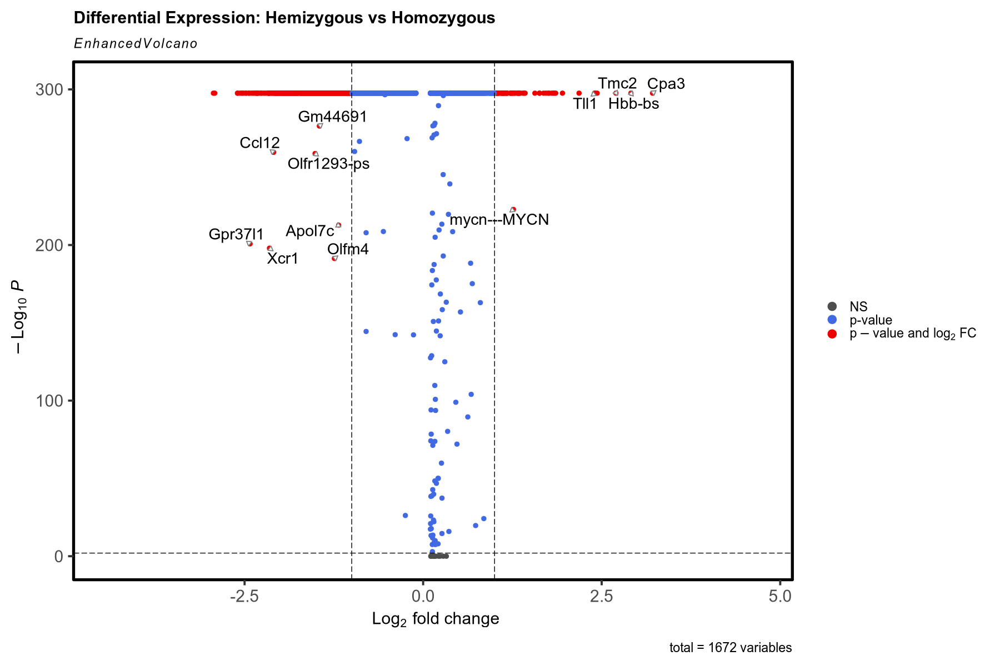

In [266]:
vplot

In [267]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R3B_hemi_vs_homo_violinplot.pdf'),
    plot=vplot, 
    height = 10,
    width = 15,
    create.dir=TRUE
      )

Warning message:
“ggrepel: 528 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


In [268]:
cell_types <- unique(seurat_obj$annot_int)

# Initialize a list to store differential expression results for each cell type
de_results_list <- list()

# Loop through each cell type and perform differential expression analysis
for (cell_type in cell_types) {
  # Subset the Seurat object to the specific cell type
  seurat_subset <- subset(seurat_obj, subset = annot_int == cell_type)
  
  # Perform differential expression analysis for the subset
  de_results <- FindMarkers(seurat_subset, ident.1 = "hemi", ident.2 = "homo", group.by = "dataset")
  
  # Add a column for gene names
  de_results$gene <- rownames(de_results)
  
  # Store the results in the list
  de_results_list[[cell_type]] <- de_results
}

Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, drop = FALSE]):
“NaNs produced”
Warning message in mean.fxn(object[features, cells.2, 

In [238]:
get_top_labels <- function(de_results, top_n = 5) {
  # Filter for top 5 upregulated genes
  top_upregulated <- de_results %>%
    arrange(desc(avg_log2FC)) %>%
    filter(avg_log2FC > 0) %>%
    slice_head(n = top_n) %>%
    pull(gene)
  
  # Filter for top 5 downregulated genes
  top_downregulated <- de_results %>%
    arrange(avg_log2FC) %>%
    filter(avg_log2FC < 0) %>%
    slice_head(n = top_n) %>%
    pull(gene)
  
  # Combine the top upregulated and downregulated genes
  top_labels <- c(top_upregulated, top_downregulated)
  
  return(top_labels)
}


In [239]:
top_labels_list <- lapply(de_results_list, get_top_labels)

In [273]:
library(EnhancedVolcano)

# Create a list to store volcano plots
volcano_plots <- list()

# Generate volcano plots for each cell type
for (cell_type in names(de_results_list)) {
  volcano_plot <- EnhancedVolcano(de_results_list[[cell_type]],
                                  lab = ifelse(de_results_list[[cell_type]]$gene %in% top_labels_list[[cell_type]],
                                               de_results_list[[cell_type]]$gene, ""),  # Label only the top 5 on each side
                                  x = 'avg_log2FC',
                                  y = 'p_val_adj',
                                  title = paste('Differential Expression in', cell_type, ': Hemizygous vs Homozygous'),
                                  pCutoff = 0.05,
                                  FCcutoff = 0.5,
                                  pointSize = 2.0,  # Smaller point size
                                  labSize = 5.0,   # Larger label size
                                  col=c('grey30', 'forestgreen', 'royalblue', 'red2'),
                                  colAlpha = 1,
                                  legendPosition = 'right',
                                  legendLabSize = 12,
                                  legendIconSize = 3.0,
                                  drawConnectors = TRUE,
                                  widthConnectors = 0.5,
                                  colConnectors = 'grey50',
                                  gridlines.major = FALSE,
                                  gridlines.minor = FALSE,
                                  border = 'full',
                                  borderWidth = 1.5,
                                  borderColour = 'black')
  
  volcano_plots[[cell_type]] <- volcano_plot
    ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    paste0('results/figures/2024/Figure_3/Figure_R3A_hemi_vs_homo_volcano_',cell_type,'.pdf')),
    plot= volcano_plot, 
    height = 10,
    width = 15,
    create.dir=TRUE
      )
}



Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”
Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”
Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”
Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”
Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”
Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”
Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”
Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”
Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”


Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


$`B cells`


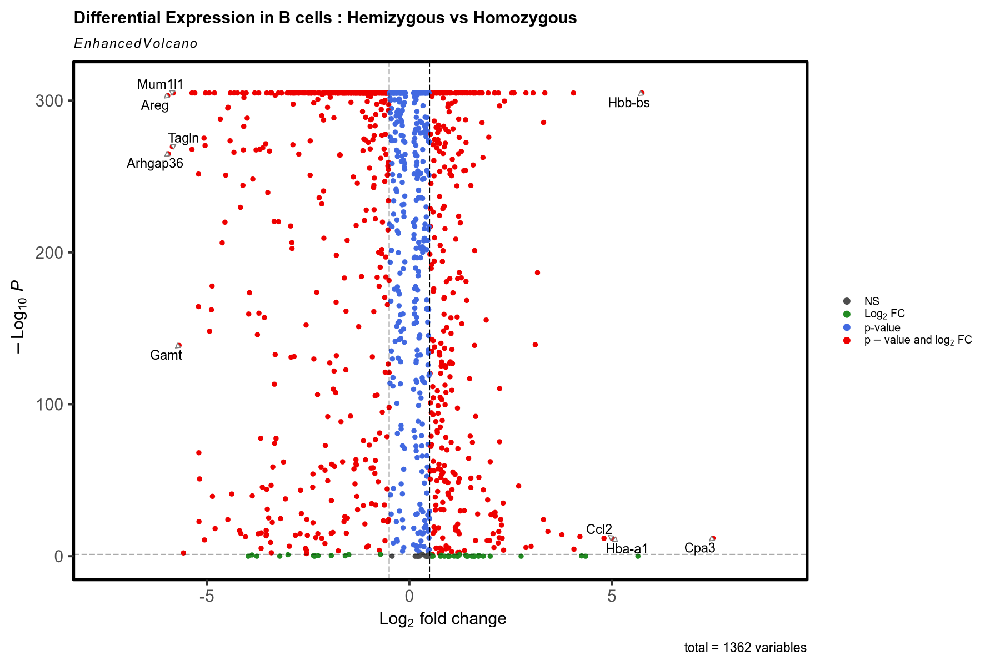

In [275]:
fig.size(10,15)
volcano_plots['B cells']

In [287]:
top_genes_list <- lapply(de_results_list, function(x) head(rownames(x[order(x$p_val_adj), ]), 10))

# Flatten the list to get unique genes across all cell types
top_genes <- unique(unlist(top_genes_list))


In [283]:
top_genes

[1] "Mctp2"      "Serpinb9"   "Tnfsf11"    "Hbb-bs"     "Nppc"      
 [6] "Chodl"      "Iglc1"      "Rbm20"      "Hist1h2ap"  "Tacc3"     
[11] "Trim47"     "Mcemp1"     "Cenph"      "Lsamp"      "Mum1l1"    
[16] "Mvd"        "Penk"       "Lpp"        "Bcl2"       "Ighm"      
[21] "Fgr"        "Ankrd26"    "Isg20"      "Cbfa2t3"    "AC158554.1"

In [279]:
seurat_obj_subset <- subset(seurat_obj, cells = sample(colnames(seurat_obj), 10000))

In [302]:
top_up_genes <- rownames(de_results_genotype[de_results_genotype$avg_log2FC > 0, ])[1:40]  # Top 10 upregulated
top_down_genes <- rownames(de_results_genotype[de_results_genotype$avg_log2FC < 0, ])[1:40]  # Top 10 downregulated

In [303]:
# Combine top upregulated and downregulated genes
top_genes <- c(top_up_genes, top_down_genes)


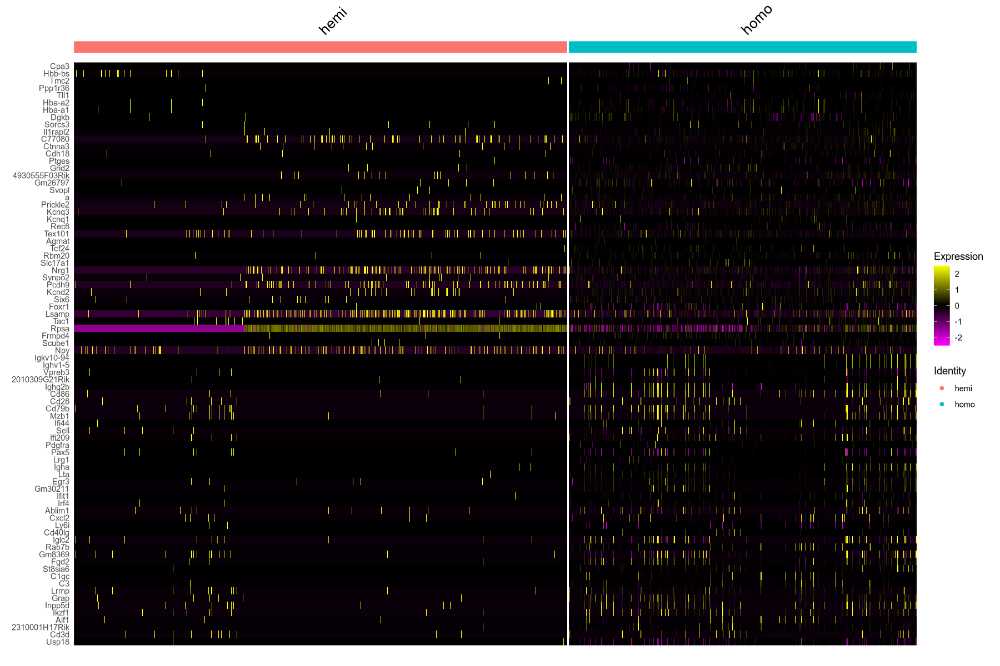

In [304]:
# Generate the heatmap for the selected genes
hmap = DoHeatmap(seurat_obj_subset, features = top_genes, group.by = "dataset") 
hmap

In [ ]:
 ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    paste0('results/figures/2024/Figure_3/Figure_R3A_hemi_vs_homo_heatmap.pdf')),
    plot= hmap, 
    height = 10,
    width = 15,
    create.dir=TRUE
      )

In [289]:
avg_expression <- AverageExpression(seurat_obj_subset, group.by = "dataset")

# Extract the RNA assay (or use your assay of interest)
avg_expression_matrix <- avg_expression$RNA


In [290]:
# Subset the average expression matrix for the top genes
avg_expression_matrix <- avg_expression_matrix[top_genes, ]

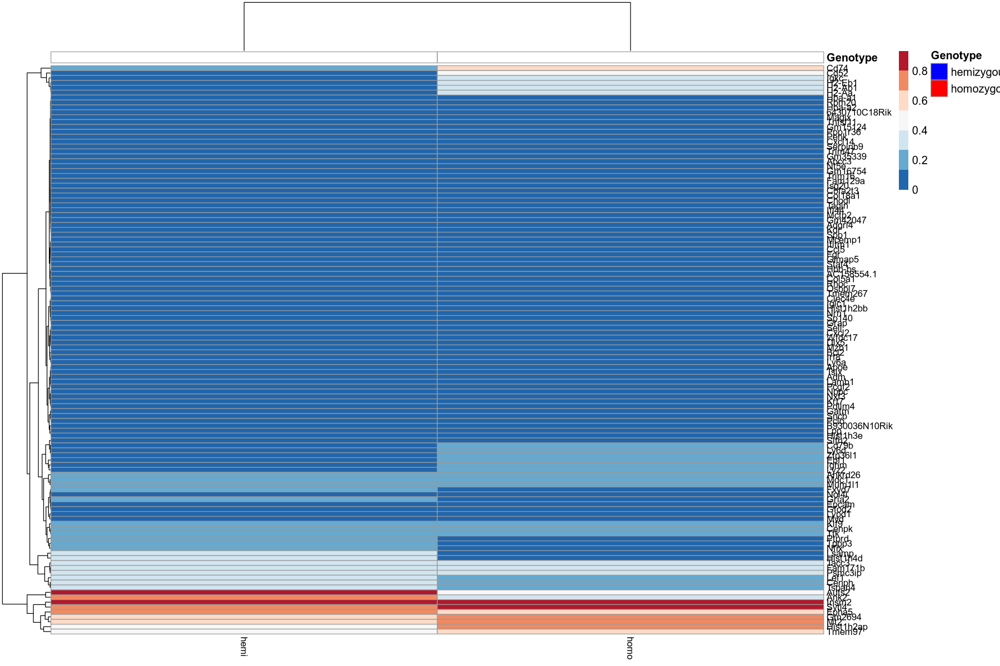

In [291]:
library(pheatmap)

# Create a heatmap using the averaged expression data
pheatmap(avg_expression_matrix,
         cluster_rows = TRUE,
         cluster_cols = TRUE,
         show_rownames = TRUE,
         show_colnames = TRUE,
         color = rev(RColorBrewer::brewer.pal(n = 7, name = "RdBu")),
         fontsize = 12,
         fontsize_row = 10,
         fontsize_col = 10,
         annotation_col = data.frame(Genotype = colnames(avg_expression_matrix)),
         annotation_colors = list(Genotype = c("hemizygous" = "blue", "homozygous" = "red")))


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


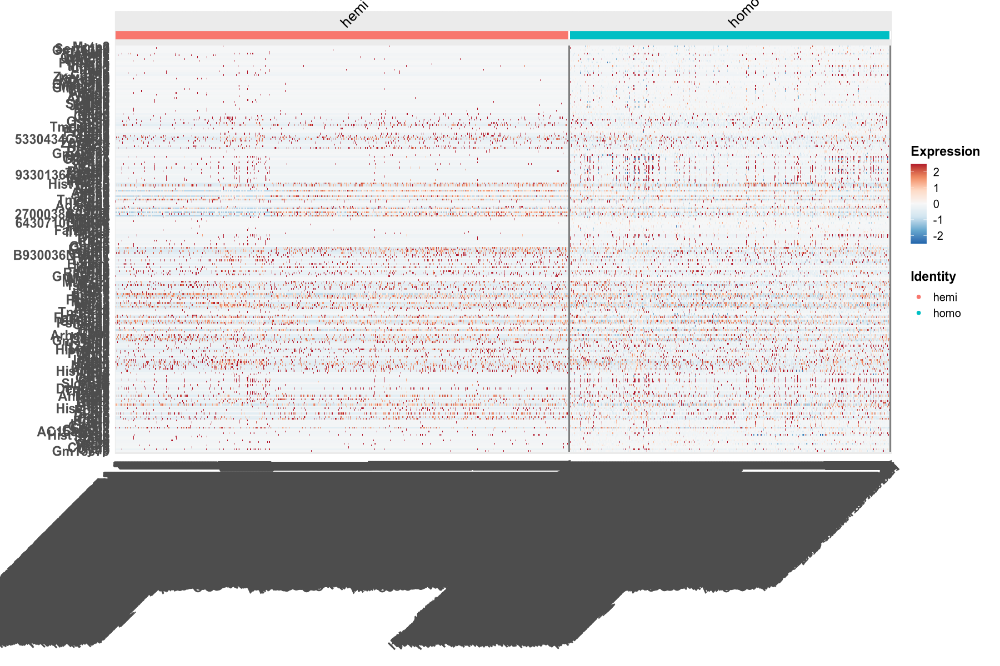

In [280]:
DoHeatmap(seurat_obj_subset, features = top_genes, group.by = "dataset") +
  scale_fill_gradientn(colors = rev(RColorBrewer::brewer.pal(n = 7, name = "RdBu"))) +
  theme_minimal(base_size = 14) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 14, face = "bold"),
        axis.text.y = element_text(size = 14, face = "bold"),
        plot.title = element_text(face = "bold", size = 16, hjust = 0.5),
        legend.title = element_text(size = 14, face = "bold"),
        legend.text = element_text(size = 12))

In [278]:
library(pheatmap)

# Get the scaled data for the top genes
expression_matrix <- GetAssayData(seurat_obj, slot = "scale.data")[top_genes, ]

# Create a heatmap with pheatmap
pheatmap(expression_matrix,
         cluster_rows = TRUE,
         cluster_cols = TRUE,
         annotation_col = seurat_obj@meta.data[, "dataset", drop = FALSE],
         show_rownames = TRUE,
         show_colnames = FALSE,
         color = rev(RColorBrewer::brewer.pal(n = 7, name = "RdBu")),
         fontsize = 12,
         fontsize_row = 10,
         fontsize_col = 10)


Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”
